# Introduction to numerical algorithms
## Practice class 5

### Topics

- Eigenvalues, eigenvectors
- Applications in more physical context
- Derivatives with finite methods

In [3]:
import subprocess
import sys

def import_or_install(package):
    try:
        __import__(package)
    except ImportError:
        print(f"Package '{package}' not found. Installing...")
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "--break-system-packages", package
        ])
        print(f"Package '{package}' installed successfully.")

import_or_install('numpy')
import numpy as np
np.random.seed(42)
import_or_install('pandas')
import pandas as pd
import_or_install('matplotlib')
import matplotlib.pyplot as plt 
import matplotlib as mpl
import_or_install('time')
import time
import_or_install('tqdm')
from tqdm import tqdm
import_or_install('scipy')
import scipy
import scipy.integrate as intgr
from matplotlib.animation import FuncAnimation, PillowWriter
from typing import Callable, Tuple

# credit to https://github.com/engineersCode/EngComp4_landlinear/tree/maste

Package 'pandas' not found. Installing...
  Using cached pandas-2.3.3-cp313-cp313-macosx_11_0_arm64.whl.metadata (91 kB)
  Using cached pytz-2025.2-py2.py3-none-any.whl.metadata (22 kB)
  Using cached tzdata-2025.2-py2.py3-none-any.whl.metadata (1.4 kB)
Using cached pandas-2.3.3-cp313-cp313-macosx_11_0_arm64.whl (10.7 MB)
Using cached pytz-2025.2-py2.py3-none-any.whl (509 kB)
Using cached tzdata-2025.2-py2.py3-none-any.whl (347 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [pandas]2m2/3 [pandas]
Package 'pandas' installed successfully.
Package 'matplotlib' not found. Installing...
  Using cached contourpy-1.3.3-cp313-cp313-macosx_11_0_arm64.whl.metadata (5.5 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
  Using cached kiwisolver-1.4.9-cp313-cp313-macosx_11_0_arm64.whl.metadata (6.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 1.8 MB/s eta 0:00:00a 0:00:01
Using cached contourpy-1.3.3-cp313-cp313-macosx_11_0_arm64.whl (274 kB)
Using cached cycle

## Task 1

Consider a system of coupled oscillators as below

![](./osc.png)

Asssume that from left to right the masses are $m_1$ and $m_2$ and the coupling strengths are $D_1$, $D_2$ and $D_3$. Let's investigate this system analytically! To start, let's try to write down the equations of motion. Simple-mindedly writing down the Newtonian equations of motions ($F=ma$) results in:

$$
m_1\ddot{x}_1 = -D_1x_1+D_2(x_2-x_1)\\
m_2\ddot{x}_2 = -D_3x_2-D_2(x_2-x_1)
$$

Now can we do anything more? Think about linear algebra!

We can rearrange the equations into matrix form, with a so-called mass ($M$) and spring matrix($D$):
$$
\textbf{M} \ddot{\underline{x}} = -\textbf{D} \underline{x}\\
\textbf{M} =  \begin{pmatrix}
        m_1 & 0 \\
        0 & m_2
    \end{pmatrix}\\
\textbf{D} =  \begin{pmatrix}
        D_1+D_2 & -D_2 \\
        -D_2 & D_2+D_3
    \end{pmatrix}\\
$$

Now if you are familiar with differential equations, this can be solved, and the solution should be something like $\ddot{x}_i=-\omega_i x_i$, hence:
$$
\underline{x}(t) = \underline{\eta}\cdot sin(\omega \cdot t + \phi)
$$
Which makes sense, even if you dont know diff. eqs, as the motion somehow should be kinda periodic, hence the sine term.

Notice the mode vector here $\underline{\eta}$. This guy will be important!

Now let's visualize the motion!

Pretending for the moment, that we know how to integrate numerically, we will let `odeint` take care of the black magic. The brute-force numerical solution is:

In [59]:
def equations(X, t, m1, m2, k1, k2, k3):
    x1, x2, v1, v2 = X    # unpack variables
    dx1 = v1
    dx2 = v2
    dv1 = -k1/m1 * x1 + k2/m1 * (x2 - x1)
    dv2 = -k3/m2 * x2 - k2/m2 * (x2 - x1)
    dXdt = [dx1, dx2, dv1, dv2]    # pack derivatives
    return dXdt

In [60]:
# choose parameters
m1, m2 = 1, 1
k1, k2, k3 = 1, 2, 1

# specify initial values
x1i, x2i, = 0, 0.4
v1i, v2i = 0, 0
init = [x1i, x2i, v1i, v2i]

T = 20.    # total time to solve for
time = np.arange(0, T, 0.1)    # time points to evaluate solution at

sol = intgr.odeint(equations, init, time, args=(m1, m2, k1, k2, k3))    # solve equations
X = sol[:,0:2]    # vector X consists of the first three components of the solution

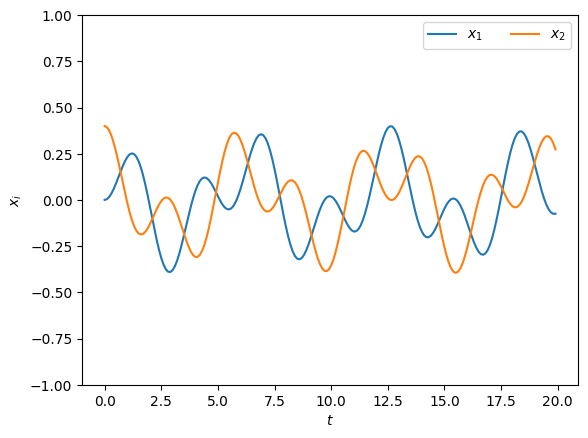

In [61]:
plt.figure()
for i in range(2):
    plt.plot(time, X[:,i], label=f'$x_{i+1}$')
plt.ylim(-1, 1)
plt.xlabel(r'$t$')
plt.ylabel(r'$x_i$')
plt.legend(ncol=3)
plt.show()

The dynamics look a bit “chaotic”. To gain more insight into the dynamics, we will decompose them into normal modes using matrix diagonalization.

Your task is:
1. Recognize that by clever rescaling you can rearrange the equation in the form of $$\ddot{\mathbf{X}} = - \mathbf{A} \cdot \mathbf{X}$$ Now you should be suspicios because this looks like a SLAE (System of Linear Algebraic Equation)! Assume $A$ can be diagonalized. Then:
\begin{equation}
\mathbf{A} = \mathbf{R} \cdot \mathbf{D} \cdot \mathbf{R}^{-1}
\end{equation}
where $\mathbf{D}$ is a diagonal matrix formed by the eigenvalues of $\mathbf{A}$, and $\mathbf{R}$ is a matrix whose columns are the corresponding eigenvectors of $\mathbf{A}$, i.e.,
\begin{equation}
\mathbf{D} = \left( \begin{array}{ccc} \lambda_1 & \\ & \lambda_2 \end{array} \right) \,, \qquad
\mathbf{R} = \left( \begin{array}{ccc} \vec{\xi^{(1)}} & \vec{\xi^{(2)}} \end{array} \right)
\end{equation}
In general case, $\mathbf{D}$ and $\mathbf{R}$ can be $N$ dimensional.
**Use `numpy` to diagonalize your matrix as such!**
2. We can use $\mathbf{R}$ to transform $\mathbf{X}$ to a new set of variables $\mathbf{X}' \equiv \mathbf{R}^{-1} \cdot \mathbf{X}$. With this transformation, the equation for $\mathbf{X}'$ simplifies to:
\begin{equation}
\ddot{\mathbf{X}'} = - \mathbf{D} \cdot \mathbf{X}'
\end{equation}
Thus, each component satisfies an equation $\ddot{x}'_i = - \lambda_i x'_i$, the solution of which is just:
\begin{equation}
x'_i(t) = A_i \sin(\omega_i t) + B_i \cos(\omega_i t)
\end{equation}
the actual value of the $A$ and $B$ are depending on the initial condition as,
$$
A_i = \dot{X}_i'(0) / \omega_i  = \{\mathbf{R}^{-1} \cdot \mathbf{X}(0)\}_i/\omega_i \\
B_i = X_i'(0) = \{\mathbf{R}^{-1} \cdot \mathbf{X}(0)\}_i
$$
 and $\omega_i = \sqrt{\lambda_i}$ (we need $\lambda_i \geq 0$, which is true for $\mathbf{A}$, as shown below). Therefore, the solution for the original variables can be written as a sum over **normal modes**:
\begin{equation}
\mathbf{X}(t) = \mathbf{R} \cdot \mathbf{X}'(t) = \sum_i \vec{\xi^{(i)}} (A_i \sin(\omega_i t) + B_i \cos(\omega_i t)
\end{equation}
Each mode has its own frequency of oscillation $\omega_i$, and the normalized eigenvector $\vec{\xi^{(i)}}$ represents the "direction" of each mode, whereas $A_i$ and $B_i$ represents the "amplitude" of each mode.
**Find the eigenvectors and eigenvalues (mode vectors and eigenfrequencies in fact)**

3. Substitute back to the solution! Plot the trajectories for each mass found by the integration and found via eigenvalue problem!

4. Decompose the motion of the different modes and plot them!

5. Knowing the modes of the system, check the trajectories for different initial conditions and plot them! Notice that in the last equations the initial conditions matter and appear in the solutions. Where exactly do you have to use the initial conditions, when computing the trajectories with the help of the modes?

In [62]:
# Part 1: Matrix diagonilazation
m1, m2 = 1, 1
M = np.array([[m1, 0], [0, m2]])

k1, k2, k3 = 1, 2, 1
K = np.array([[k1 + k2, -k2], [-k2, k2 + k3]])

A = np.linalg.inv(M) @ K                    # matrix A = M^-1 K
print("Matrix A:\n", A)

eigenvals, eigenvecs = np.linalg.eig(A)     # compute eigenvalues and eigenvectors of A
D = np.diag(eigenvals)                      # diagonal matrix D of eigenvalues
R = eigenvecs                               # matrix R of eigenvectors
R_inv = np.linalg.inv(R)                    # inverse of R

print("Matrix R (eigenvectors):\n", R)
print("Matrix D (eigenvalues):\n", D)
print("Matrix R_inv (inverse of R):\n", R_inv)
print("Check: R @ D @ R_inv =\n", R @ D @ R_inv)

Matrix A:
 [[ 3. -2.]
 [-2.  3.]]
Matrix R (eigenvectors):
 [[ 0.70710678  0.70710678]
 [-0.70710678  0.70710678]]
Matrix D (eigenvalues):
 [[5. 0.]
 [0. 1.]]
Matrix R_inv (inverse of R):
 [[ 0.70710678 -0.70710678]
 [ 0.70710678  0.70710678]]
Check: R @ D @ R_inv =
 [[ 3. -2.]
 [-2.  3.]]


In [63]:
# Part 2: Mode analysis

# Mode frequencies / natural frequencies:
ω = np.sqrt(eigenvals)
print("Mode frequencies ω:", ω)
# Mode vector / normalized eigenvectors:
𝜉 = eigenvecs / np.linalg.norm(eigenvecs, axis=0)
print("Mode vectors 𝜉:\n", 𝜉)

Mode frequencies ω: [2.23606798 1.        ]
Mode vectors 𝜉:
 [[ 0.70710678  0.70710678]
 [-0.70710678  0.70710678]]


Initial positions: [0.  0.4]
Initial velocities: [0 0]


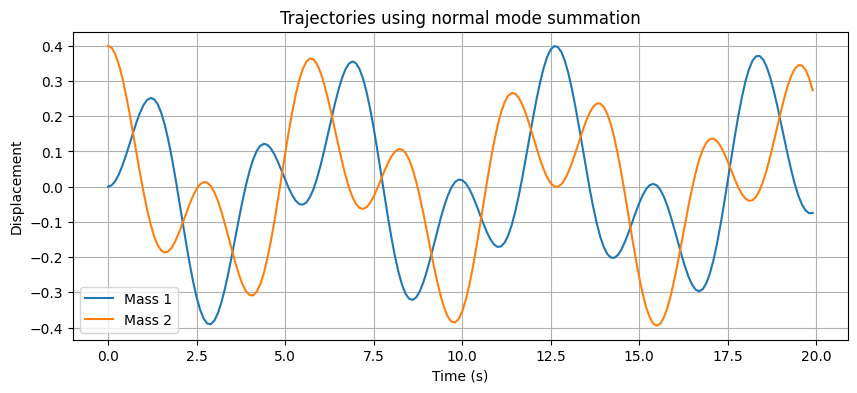

In [76]:
# Part 3: Finding X(t)

# specify initial values
x1i, x2i, = 0, 0.4
v1i, v2i = 0, 0
X_i = np.array([x1i, x2i])
X_i_dot = np.array([v1i, v2i])
print("Initial positions:", X_i)
print("Initial velocities:", X_i_dot)

T = 20                          # total time to solve for
time = np.arange(0, T, 0.1)     # time points to evaluate solution at


def get_X_t_sum(time, eigenvals, eigenvecs, X_i, X_i_dot):
    ω = np.sqrt(eigenvals)
    R_inv = np.linalg.inv(eigenvecs)
    A = (R_inv @ X_i_dot) / ω
    B = R_inv @ X_i

    X_t = []
    for t in time:
        X_t_current = np.zeros(len(X_i))
        for i in range(len(ω)):
            X_t_current += eigenvecs[:, i] * (A[i] * np.sin(ω[i] * t) + B[i] * np.cos(ω[i] * t))
        X_t.append(X_t_current)

    return np.array(X_t)
    
X_t_sum = get_X_t_sum(time, eigenvals, R, X_i, X_i_dot)

import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))
plt.plot(time, X_t_sum[:,0], label='Mass 1')
plt.plot(time, X_t_sum[:,1], label='Mass 2')
plt.xlabel('Time (s)')
plt.ylabel('Displacement')
plt.title('Trajectories using normal mode summation')
plt.legend()
plt.grid(True)
plt.show()


/var/folders/dy/crwmhrjj0cqbyz9960bfh8zm0000gn/T/ipykernel_79044/2424875085.py:29: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(time, X_total[:, 0], 'k', lw=2, color='red', label='Mass 1 total')
/var/folders/dy/crwmhrjj0cqbyz9960bfh8zm0000gn/T/ipykernel_79044/2424875085.py:41: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(time, X_total[:, 1], 'k', lw=2, color='black', label='Mass 2 total')


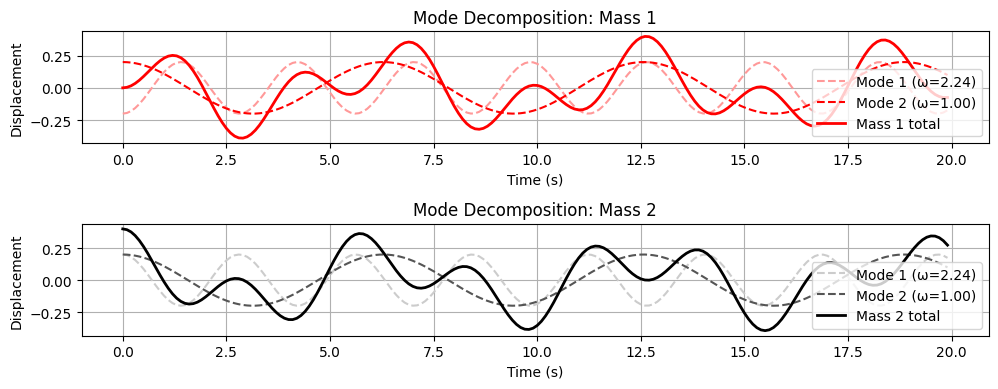

In [77]:
# Part 4: Mode decomposition function
def mode_decomposition(time, eigenvals, eigenvecs, X_i, X_i_dot):
    ω = np.sqrt(eigenvals)
    R_inv = np.linalg.inv(eigenvecs)
    A = (R_inv @ X_i_dot) / ω
    B = R_inv @ X_i

    n_modes = len(ω)
    n_dof = len(X_i)
    X_modes = np.zeros((len(time), n_modes, n_dof))

    for i in range(n_modes):
        ξ = eigenvecs[:, i]
        for j, t in enumerate(time):
            X_modes[j, i, :] = ξ * (A[i] * np.sin(ω[i] * t) + B[i] * np.cos(ω[i] * t))

    X_total = np.sum(X_modes, axis=1)
    return X_modes, X_total, ω


X_modes, X_total, ω = mode_decomposition(time, eigenvals, R, X_i, X_i_dot)

plt.figure(figsize=(10, 4))
# Plot for Mass 1
plt.subplot(2, 1, 1)
colors_red = ['#ff9999', '#ff0000', '#800000', '#ff6666']
for i in range(X_modes.shape[1]):
    plt.plot(time, X_modes[:, i, 0], '--', color=colors_red[i % len(colors_red)], label=f'Mode {i+1} (ω={ω[i]:.2f})')
plt.plot(time, X_total[:, 0], 'k', lw=2, color='red', label='Mass 1 total')
plt.xlabel('Time (s)')
plt.ylabel('Displacement')
plt.title('Mode Decomposition: Mass 1')
plt.legend()
plt.grid(True)

# Plot for Mass 2
plt.subplot(2, 1, 2)
colors_black = ['#cccccc', '#555555', '#000000', '#888888']
for i in range(X_modes.shape[1]):
    plt.plot(time, X_modes[:, i, 1], '--', color=colors_black[i % len(colors_black)], label=f'Mode {i+1} (ω={ω[i]:.2f})')
plt.plot(time, X_total[:, 1], 'k', lw=2, color='black', label='Mass 2 total')
plt.xlabel('Time (s)')
plt.ylabel('Displacement')
plt.title('Mode Decomposition: Mass 2')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


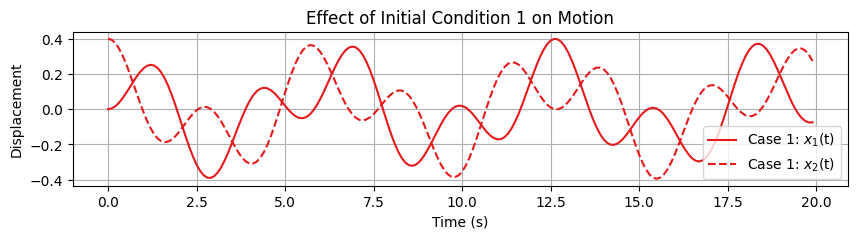

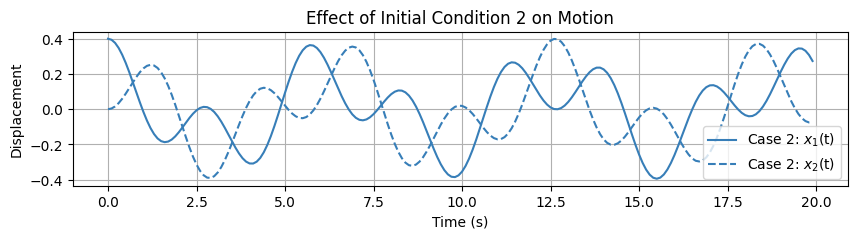

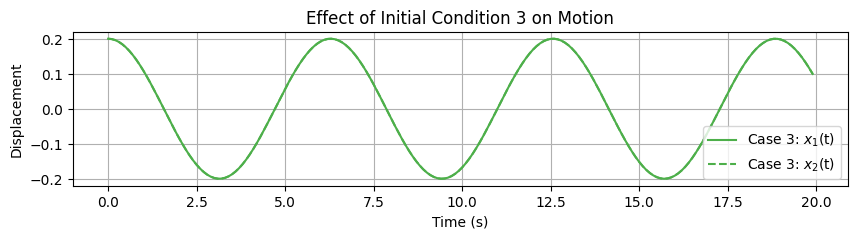

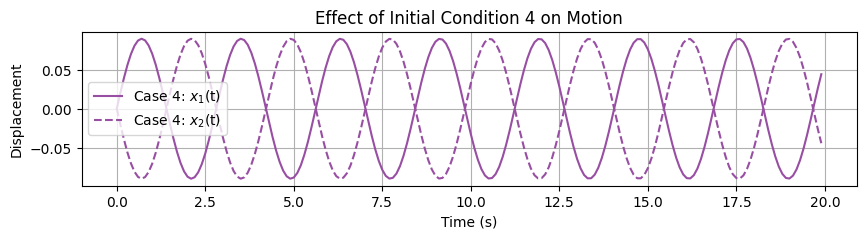

In [78]:
# Part 5: Initial conditions effects
initial_conditions = [
    (np.array([0, 0.4]), np.array([0, 0])),      # only mass 2 displaced
    (np.array([0.4, 0]), np.array([0, 0])),      # only mass 1 displaced
    (np.array([0.2, 0.2]), np.array([0, 0])),    # both displaced equally
    (np.array([0, 0]), np.array([0.2, -0.2])),   # initial velocity excitation
]

case_colors = ['#e41a1c', '#377eb8', '#4daf4a', '#984ea3']      # Distinct colors for each case

for idx, (X_i, X_i_dot) in enumerate(initial_conditions):
    _, X_total, _ = mode_decomposition(time, eigenvals, R, X_i, X_i_dot)
    plt.figure(figsize=(10, 2))
    plt.plot(time, X_total[:, 0], color=case_colors[idx], label=f'Case {idx+1}: $x_1$(t)')
    plt.plot(time, X_total[:, 1], '--', color=case_colors[idx], label=f'Case {idx+1}: $x_2$(t)')
    plt.xlabel('Time (s)')
    plt.ylabel('Displacement')
    plt.title(f'Effect of Initial Condition {idx+1} on Motion')
    plt.legend()
    plt.grid(True)
    plt.show()


If you have the modes, then with this function you can animate:

In [79]:
import matplotlib.animation as anim

plt.rcParams["animation.html"] = "jshtml"
fig, ax = plt.subplots(figsize=(4,4))
ax.set_xlim(-1, 3)
ax.set_ylim(-0.5, 2.5)
ax.axis('off')
ax.text(-1, 0.2, 'all modes')
ax.text(-1, 1.2, 'mode 1')
ax.text(-1, 2.2, 'mode 2')
p1, = ax.plot([], [], 'o-')     # plot masses in mode 1
p2, = ax.plot([], [], 'o-')     # plot masses in mode 2
p0, = ax.plot([], [], 'o-')     # plot masses in all modes
offset = np.arange(2)       # add natural length of springs

def animate(t):
    p1.set_data(X_modes[t, 0, :] + offset, [1, 1])
    p2.set_data(X_modes[t, 1, :] + offset, [2, 2])
    p0.set_data(X_total[t, :] + offset, [0, 0])

mov = anim.FuncAnimation(fig, animate, frames=len(time), interval=50)
plt.close()

In [80]:
mov

Finally, we can plot the configuration of the system in a 3-D space to visualize the superposition of the modes.

In [81]:
fig2D = plt.figure(figsize=(5, 5))
ax = fig2D.add_subplot()
ax.set_xlim(-1, 1)
ax.set_ylim(-1, 1)
ax.set_xlabel(f'$x_1$')
ax.set_ylabel(f'$x_2$')
ax.plot([R[0, 0], -R[0, 0]], [R[1, 0], -R[1, 0]], 'blue')    # plot eigenvector 1
ax.plot([R[0, 1], -R[0, 1]], [R[1, 1], -R[1, 1]], 'orange')  # plot eigenvector 2
p1, = ax.plot([], [], 'o', label='Mode 1')    # plot displacements in mode 1
p2, = ax.plot([], [], 'o', label='Mode 2')    # plot displacements in mode 2
p0, = ax.plot([], [], '-', label='Total Displacement')    # plot total displacements

def animate2D(t):
    p1.set_data([X_modes[t, 0, 0]], [X_modes[t, 0, 1]])
    p2.set_data([X_modes[t, 1, 0]], [X_modes[t, 1, 1]])
    p0.set_data(X_total[:t+1, 0], X_total[:t+1, 1])
    ax.legend()

mov2D = anim.FuncAnimation(fig2D, animate2D, frames=len(time), interval=50)
plt.close()

In [82]:
mov2D

## Warmup

Use vectorized methods to calculate the following quantities:
1. $y_i = x_{i+1} - x_{i}$
2. $y_i = x_{i} - x_{i-2}$
3. $y_i = 3x_{i}-4x_{i-1}+x_{i-2}$

Be careful with the length of the resultant array!
Use the provided array as input!

In [83]:
t=np.linspace(0,np.pi/2,10)
x=np.sin(t)

In [84]:
# 1. y_i = x_{i+1} - x_i
y1 = x[1:] - x[:-1]  # length = len(x) - 1

# 2. y_i = x_i - x_{i-2}
y2 = x[2:] - x[:-2]  # length = len(x) - 2

# 3. y_i = 3*x_i - 4*x_{i-1} + x_{i-2}
y3 = 3*x[2:] - 4*x[1:-1] + x[:-2]  # length = len(x) - 2

# Print results
print("y1 =", y1)
print("y2 =", y2)
print("y3 =", y3)

y1 = [0.17364818 0.16837197 0.15797986 0.14278761 0.12325683 0.09998096
 0.07366722 0.04511513 0.01519225]
y2 = [0.34202014 0.32635182 0.30076747 0.26604444 0.22323779 0.17364818
 0.11878235 0.06030738]
y3 = [0.33146772 0.3055676  0.27038297 0.22698289 0.17668605 0.12102069
 0.06167818 0.00046161]


### Task 2 - Compare finite difference methods

In this task you are going to compare the different finite difference derivative methods. In order to do that you are going to write a function what calculates finite differences.

**Central**
| Order | Accuracy | -2   | -1   | 0    | 1   | 2     |
|-------|----------|------:|------:|------:|-----:|-------:|
| 1     | 2        |      | -1/2 | 0    | 1/2 |       |
| 1     | 4        | 1/12 | −2/3 |   0  | 2/3 | −1/12 |

**Forward**
| Order | Accuracy  | 0    | 1   | 2     |
|-------|-----------|------:|-----:|-------:|
| 1     | 1         |  −1  |  1  |       |
| 1     | 2         | −3/2 |  2  |  −1/2 |

**Backward**
| Order | Accuracy | -2   | -1   | 0    |
|-------|----------|------:|------:|------:|
| 1     | 1        |      |  −1  |  1   |
| 1     | 2        |  1/2 |  −2  | 3/2  |

1. Write a function ` my_der_calc(f,a,b,N,option)`, with the output as `[df,X]`, where `f` is a function object, `a` and `b` are scalars such that `a < b`, `N` is an integer bigger than 10, and `option` is the string forward, backward, or central. Let `x` be an array starting at `a`, ending at `b`, containing `N` evenly spaced elements, and let $y$ be the array $f(x)$. The output argument, `df`, should be the numerical derivatives computed for $x$ and $y$ according to the method defined by the input argument, option. The output argument `X` should be an array the same size as `df` containing the points in `x` for which `df` is valid. Specifically, the forward difference method “loses” the last point, the backward difference method loses the first point, and the central difference method loses the first and last points.

2. Add an other argument to your previous funtion, `accuracy`, what is an integer and can be 1 or 2 based on the rows of the tables above. (And even larger values, see: https://en.wikipedia.org/wiki/Finite_difference_coefficient). 

3. Test your function. Use the code below to test you function on two different predefined use cases. 



In [ ]:
def my_der_calc(f: callable, a: float, b: float, N: int, option: str, accuracy: int = 1):
    if a >= b:
        raise ValueError("Invalid interval: 'a' must be less than 'b'.")
    if N < 10:
        raise ValueError("N must be at least 10 for a reasonable approximation.")
    if option not in ['forward', 'backward', 'central']:
        raise ValueError("Option must be 'forward', 'backward', or 'central'.")
    if accuracy not in [1, 2, 4]:
        raise ValueError("Accuracy must be 1, 2, or 4.")

    x = np.linspace(a, b, N)
    y = f(x)
    h = x[1] - x[0]

    # Forward
    if option == 'forward':
        if accuracy == 1:
            coeffs = np.array([-1, 1])
            stencil = [0, 1]
        elif accuracy == 2:
            coeffs = np.array([-3/2, 2, -1/2])
            stencil = [0, 1, 2]
        else:
            raise ValueError("Accuracy not supported for forward method.")
        df = np.convolve(y, coeffs[::-1], mode='valid') / h
        X = x[:len(df)]
    
    # Backward
    elif option == 'backward':
        if accuracy == 1:
            coeffs = np.array([-1, 1])
            stencil = [-1, 0]
        elif accuracy == 2:
            coeffs = np.array([1/2, -2, 3/2])
            stencil = [-2, -1, 0]
        else:
            raise ValueError("Accuracy not supported for backward method.")
        df = np.convolve(y, coeffs, mode='valid') / h
        X = x[len(x) - len(df):]
    
    # Central
    elif option == 'central':
        if accuracy == 1:
            coeffs = np.array([-1/2, 0, 1/2])
            stencil = [-1, 0, 1]
        elif accuracy == 2:
            coeffs = np.array([1/12, -2/3, 0, 2/3, -1/12])
            stencil = [-2, -1, 0, 1, 2]
        else:
            raise ValueError("Accuracy not supported for central method.")
        # For central, remove edges
        k = len(coeffs)//2
        df = np.convolve(y, coeffs[::-1], mode='valid') / h
        X = x[k: -k]
    else:
        raise ValueError("Option must be 'forward', 'backward', or 'central'.")

    return df, X

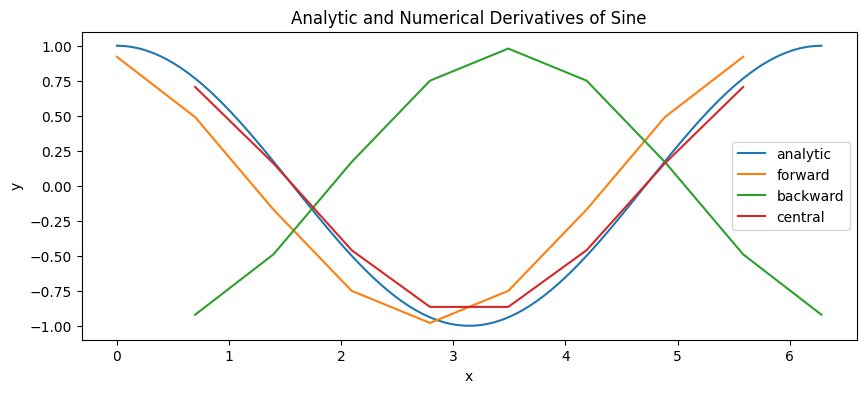

In [90]:
# Test code for Task 2.
x = np.linspace(0, 2*np.pi, 100)
f = lambda x: np.sin(x)
accuracy=1
[dyf, Xf] = my_der_calc(f, 0., 2*np.pi, 10, 'forward',accuracy)
[dyb, Xb] = my_der_calc(f, 0., 2*np.pi, 10, 'backward',accuracy)
[dyc, Xc] = my_der_calc(f, 0., 2*np.pi, 10, 'central',accuracy)
plt.figure(figsize = (10, 4))
plt.plot(x, np.cos(x), label = 'analytic')
plt.plot(Xf, dyf, label = 'forward')
plt.plot(Xb, dyb, label = 'backward')
plt.plot(Xc, dyc, label = 'central')
plt.legend()
plt.title('Analytic and Numerical Derivatives of Sine')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

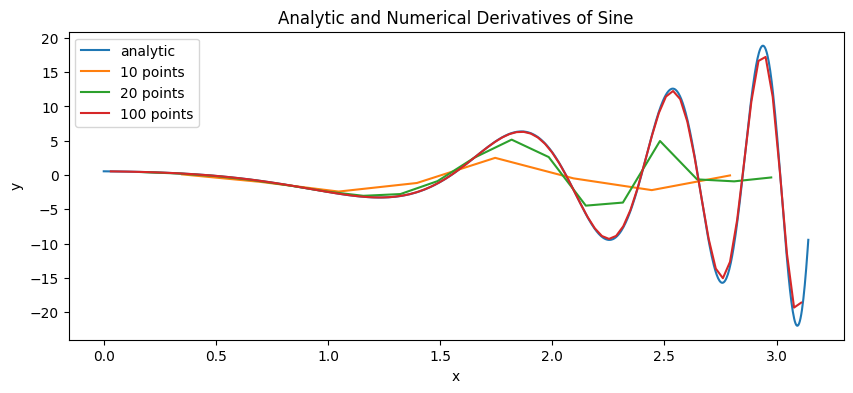

In [91]:
#Test code for task 2
x = np.linspace(0, np.pi, 1000)
f = lambda x: np.sin(np.exp(x))
accuracy=1
[dy10, X10] = my_der_calc(f, 0., np.pi, 10, 'central',accuracy)
[dy20, X20] = my_der_calc(f, 0., np.pi, 20, 'central',accuracy)
[dy100, X100] = my_der_calc(f, 0., np.pi, 100, 'central',accuracy)
plt.figure(figsize = (10, 4))
plt.plot(x, np.cos(np.exp(x))*np.exp(x), label = 'analytic')
plt.plot(X10, dy10, label = '10 points')
plt.plot(X20, dy20, label = '20 points')
plt.plot(X100, dy100, label = '100 points')
plt.legend()
plt.title('Analytic and Numerical Derivatives of Sine')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

### **Task 3 — Convergence and Roundoff Error Study**

1. **Goal:**
   Examine how the finite difference error changes as the step size ( h ) decreases.

2. **Steps:**

   * Use your `my_der_calc` function with the test function $ f(x) = \sin(x) $.
   * Its exact derivative is $ f'(x) = \cos(x) $.
   * Compute the derivative numerically over ([0, \pi]) using the **central difference** method with **2nd-order accuracy**.
   * Vary the number of points `N` (e.g. `[10, 20, 40, 80, 160, 320, 640, 1280, 2560]`).
   * For each `N`, compute the **maximum absolute error**:
     $$
     E(N) = \max | f'(x_i) - f'_{\text{num}}(x_i) |
     $$
   * Plot $ E(N) $ versus $ h = \frac{b-a}{N-1} $ on a log-log scale.

3. **Expected behavior:**

   * Initially, as $ h $ decreases, the error $ E $ decreases approximately as $O(h^p)$, where $ p $ is the order of the method.
   * But for very small $ h $, floating-point **round-off error** becomes dominant, and the error **stops decreasing** (or even increases).
   * This demonstrates the balance between **truncation error** and **round-off error** in numerical differentiation.

4. **Optional extension:**

   * Estimate the **experimental order of convergence (EOC)** by comparing consecutive error values:
     $$
     p \approx \frac{\log(E_i / E_{i+1})}{\log(h_i / h_{i+1})}
     $$

**Remark:** use first order derivation scheme for this task.


       N            h           Error        EOC
--------------------------------------------------
      10   3.4907e-01    3.736471e-04        nan
      20   1.6535e-01    2.348862e-05     3.7028
      40   8.0554e-02    1.384279e-06     3.9372
      80   3.9767e-02    8.308317e-08     3.9852
     160   1.9758e-02    5.076109e-09     3.9964
     320   9.8483e-03    3.134956e-10     3.9991
     640   4.9164e-03    1.951939e-11     3.9964
    1280   2.4563e-03    1.224687e-12     3.9899
    2560   1.2277e-03    2.013945e-13     2.6028


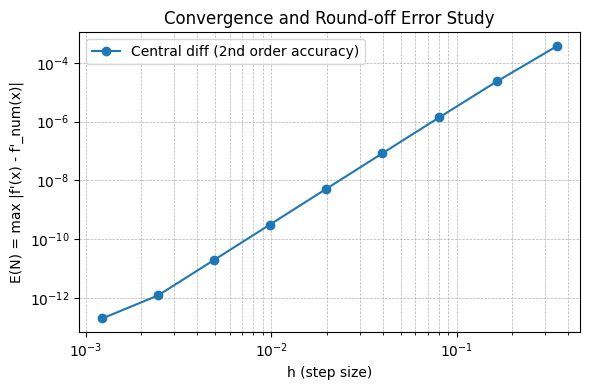

In [94]:
def f(x):
    return np.sin(x)

def fprime_exact(x):
    return np.cos(x)

a, b = 0.0, np.pi
Ns = [10, 20, 40, 80, 160, 320, 640, 1280, 2560]

max_abs_errors = []
hs = []

for N in Ns:
    df_num, X = my_der_calc(f, a, b, N, option='central', accuracy=2)
    df_exact = fprime_exact(X)
    error = np.max(np.abs(df_exact - df_num))
    h = (b - a) / (N - 1)
    max_abs_errors.append(error)
    hs.append(h)

# Experimental order of convergence
EOC = [np.nan]
for i in range(1, len(max_abs_errors)):
    p = np.log(max_abs_errors[i - 1] / max_abs_errors[i]) / np.log(hs[i - 1] / hs[i])
    EOC.append(p)

# Print table
print(f"{'N':>8} {'h':>12} {'Error':>15} {'EOC':>10}")
print("-" * 50)
for N, h, e, p in zip(Ns, hs, max_abs_errors, EOC):
    print(f"{N:8d} {h:12.4e} {e:15.6e} {p:10.4f}")

# Plot E(N) vs h on log-log scale
plt.figure(figsize=(6, 4))
plt.loglog(hs, max_abs_errors, 'o-', label="Central diff (2nd order accuracy)")
plt.xlabel("h (step size)")
plt.ylabel("E(N) = max |f'(x) - f'_num(x)|")
plt.title("Convergence and Round-off Error Study")
plt.grid(True, which="both", ls="--", lw=0.5)
plt.legend()
plt.tight_layout()
plt.show()